This homework is mainly about STFT. We will show how a song is transformed into a spectrogram, and how downsampling & upsampling affects the plot. Meanwhile, a static implementation of *Equalizer* is also shown in the notebook.

# Front Matter

In fact I used to produce some music, and am quite familiar with modern audio formats. For the tasks to come, using `mp3` files simply do not work, because the compression algorithm of `mp3` files will cut some frequencies at specific times, zeroing them out so that the audio size can be reduced. Here we use a `wav` file. In fact `ogg` should suffice.

In [60]:
audio_path = "./audio/source.wav" # 東京シュノーケル - Yunomi feat. nicamoq
audio_meta = {
    "name": "東京シュノーケル",
    "artist": "Yunomi feat. nicamoq",
    "format": "wav" # Controls how the audio is loaded
}

We will use `scipy.signal` to perform STFT, and `matplotlib` to generate the plots. `pydub` will be used to I/O the audio files.

In [61]:
import scipy.signal as signal
import numpy as np
import matplotlib.pyplot as plt
import pydub

%config InlineBackend.figure_format = 'retina'
# Enable LaTeX for matplotlib
plt.rc('text', usetex=True)
plt.rc('font', family='serif')


# Task 1: STFT and Spectrogram

We use `scipy.signal.stft` to transform a signal into a spectrogram. The spectrogram is a 2D array, where the first dimension is the time, and the second dimension is the frequency. We then use `matplotlib.pyplot.pcolormesh` to plot the spectrogram.

In [62]:
def load_audio(audio_path, audio_meta):
    if audio_meta["format"] == "wav":
        audio = pydub.AudioSegment.from_wav(audio_path)
    elif audio_meta["format"] == "mp3":
        audio = pydub.AudioSegment.from_mp3(audio_path)
    elif audio_meta["format"] == "ogg":
        audio = pydub.AudioSegment.from_ogg(audio_path)
    else:
        raise ValueError("Invalid audio format, must be one of ['wav', 'mp3', 'ogg']")
    audio_meta["sample_rate"] = audio.frame_rate
    return list(audio.get_array_of_samples())

We create the array from our `source_audio`. We will first draw the waveform.

In [63]:
source_arr = load_audio(audio_path, audio_meta)

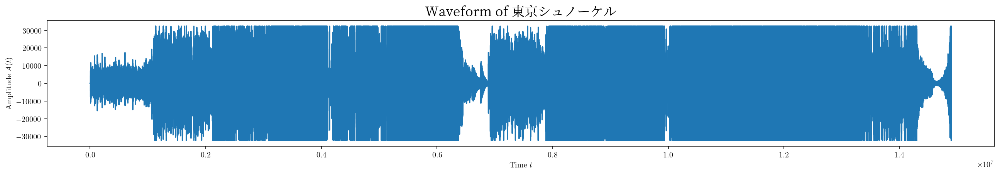

In [64]:
# Waveform plot
plt.figure(figsize=(22,3))
plt.plot(source_arr)
plt.xlabel(r'Time $t$')
plt.ylabel(r'Amplitude $A(t)$')
# Use Chinese font for title
plt.title("Waveform of " + audio_meta["name"], usetex=False, fontproperties='Noto Serif SC', fontsize=17)
plt.savefig("results/original-waveform.png")

Then we create the spectrogram of the audio using `scipy.signal.stft`.

In [65]:
source_arr_f, source_arr_t, source_arr_zxx = signal.stft(source_arr, fs=audio_meta["sample_rate"], window='hann')

C:\Users\da-kun\AppData\Local\Temp\ipykernel_17168\3652636729.py:5: RuntimeWarning: divide by zero encountered in log
  plt.pcolormesh(source_arr_t, source_arr_f, np.log(np.abs(source_arr_zxx)), cmap='RdYlBu')


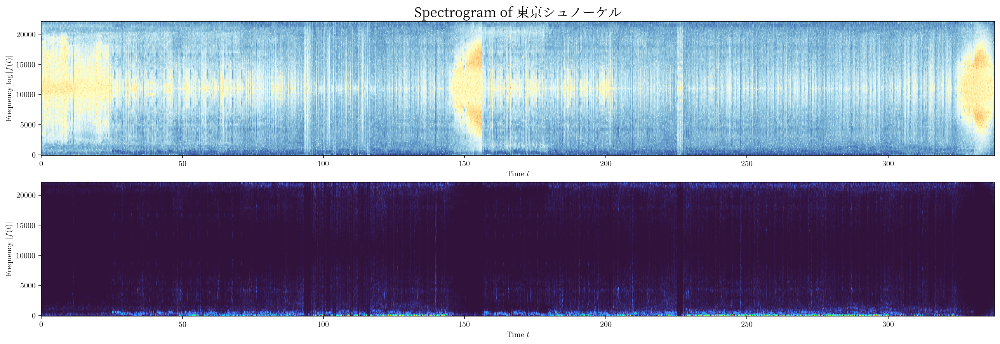

In [66]:
# Frequency spectrum
plt.figure(figsize=(22,7))
plt.subplot(2,1,1)
plt.title("Spectrogram of " + audio_meta["name"], usetex=False, fontproperties='Noto Serif SC', fontsize=17)
plt.pcolormesh(source_arr_t, source_arr_f, np.log(np.abs(source_arr_zxx)), cmap='RdYlBu')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $\log |f(t)|$')

plt.subplot(2,1,2)
plt.pcolormesh(source_arr_t, source_arr_f, np.abs(source_arr_zxx), cmap='turbo')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $|f(t)|$')
plt.savefig('results/original-spectrogram.png')

We see that the spectrogram retrieved from `scipy.signal.stft` is a 2D array, where the first dimension is the time, and the second dimension is the frequency. There are two other ways we can use to plot the spectrogram: `scipy.signal.spectrogram` and `matplotlib.pyplot.specgram`. We will test our results with both methods. Here we test our results with `matplotlib.pyplot.pcolormesh`.

C:\Program Files\Python39\lib\site-packages\matplotlib\axes\_axes.py:7626: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


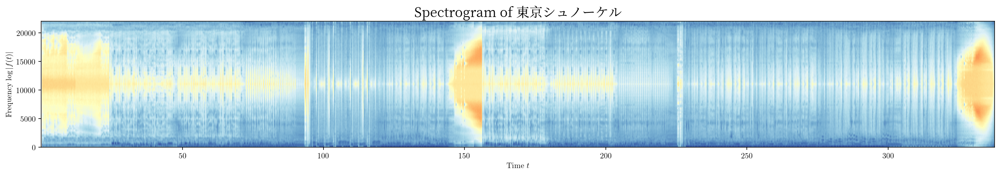

In [67]:
# Alternatively, we use matplotlib spectrogram
plt.figure(figsize=(22,3))
plt.specgram(source_arr, Fs=audio_meta["sample_rate"], cmap='RdYlBu')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $\log |f(t)|$')
plt.title("Spectrogram of " + audio_meta["name"], usetex=False, fontproperties='Noto Serif SC', fontsize=17)
plt.show()


We see that the above results that the spectrogram is confirmed.

# Task 2: Downsampling and re-constructing spectrogram

We've already see the sampling frequency of the audio as a parameter passed to `scipy.signal.stft`. But to get inside, we need to know exactly how the audio is downsampled.

First, we create a downsampler here.

In [68]:
def downsample(arr, sample_rate, target_sample_rate, interpolation=None, dtype=None):
    """
    Downsample an array to the target sample rate

    Parameters:
        arr: Downsampling target array
        sample_rate: Original sample rate of the array
        target_sample_rate: Target sample rate
        interpolation: Interpolation method, default is None, can be 'linear' or 'nearest'

    Returns:
        Downsampled array
    """
    downsampled_array = []
    sample_factor = sample_rate / target_sample_rate
    def sample_float_index(arr, index):
        if interpolation is None:
            return arr[int(index)]
        elif interpolation == "nearest":
            return arr[round(index)]
        elif interpolation == "linear":
            if abs(index - round(index)) < 1e-4:
                return arr[round(index)]
            else:
                return arr[int(index)] * (index - int(index)) + arr[int(index) + 1] * (int(index) + 1 - index)
    # Sample factor may not be an integer
    i = 0
    while round(i * sample_factor) + 1 < len(arr):
        downsampled_array.append(sample_float_index(arr, i * sample_factor))
        i += 1
    if dtype is not None:
        return np.array(downsampled_array, dtype=dtype)
    else:
        return downsampled_array

Here we use a small snippet to test our downsampler. We hereby uses linear interpolation to downsample the audio. Before we put our downsampler to test, we perform a small unit test here:

In [69]:
sample_small = [10,20,30,40,50,60,70,80,90,100]
sample_small_rounddown = downsample(sample_small, 1, 0.67, interpolation=None)
print("RoundDown:", sample_small_rounddown)
sample_small_nearest = downsample(sample_small, 1, 0.67, interpolation="nearest")
print("Nearest:", sample_small_nearest)
sample_small_linear = downsample(sample_small, 1, 0.67, interpolation="linear", dtype=float)
print("Linear:", sample_small_linear)

RoundDown: [10, 20, 30, 50, 60, 80]
Nearest: [10, 20, 40, 50, 70, 80]
Linear: [10.         25.07462687 30.14925373 55.2238806  60.29850746 85.37313433]


And here comes the real work.

In [70]:
# 5 kHz downsampling
source_arr_downsampled_5000 = downsample(source_arr, audio_meta["sample_rate"], 5000, interpolation="nearest")
print("5kHz downsampling complete, output length =", len(source_arr_downsampled_5000))
source_arr_downsampled_5000_linear = downsample(source_arr, audio_meta["sample_rate"], 5000, interpolation="linear")
print("5kHz downsampling complete, output length =", len(source_arr_downsampled_5000))
# 10 kHz downsampling
source_arr_downsampled_10000 = downsample(source_arr, audio_meta["sample_rate"], 10000, interpolation="nearest")
print("10kHz downsampling complete, output length =", len(source_arr_downsampled_10000))
# 15 kHz downsampling
source_arr_downsampled_15000 = downsample(source_arr, audio_meta["sample_rate"], 15000, interpolation="nearest")
print("15kHz downsampling complete, output length =", len(source_arr_downsampled_15000))


5kHz downsampling complete, output length = 1688934
5kHz downsampling complete, output length = 1688934
10kHz downsampling complete, output length = 3377867
15kHz downsampling complete, output length = 5066800


We then plot the three downsampled signal.

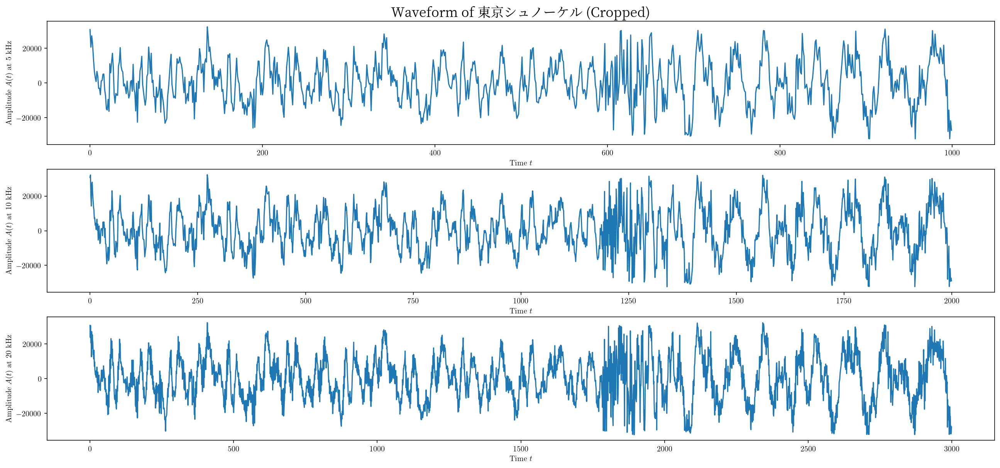

In [71]:
# Plot the downsampled waveform
crop_start = 441000
crop_end = 442000
plt.figure(figsize=(22,10))
plt.subplot(311)
plt.plot(source_arr_downsampled_5000[crop_start:crop_end])
plt.xlabel(r'Time $t$')
plt.ylabel(r'Amplitude $A(t)$ at 5 kHz')
plt.title("Waveform of " + audio_meta["name"] + " (Cropped)", usetex=False, fontproperties='Noto Serif SC', fontsize=17)
plt.subplot(312)
plt.plot(source_arr_downsampled_10000[crop_start*2:crop_end*2])
plt.xlabel(r'Time $t$')
plt.ylabel(r'Amplitude $A(t)$ at 10 kHz')
plt.subplot(313)
plt.plot(source_arr_downsampled_15000[crop_start*3:crop_end*3])
plt.xlabel(r'Time $t$')
plt.ylabel(r'Amplitude $A(t)$ at 20 kHz')
plt.show()

We can easily see from the above waveforms that **at lower sample rates, the audio is losing more details**.

In [72]:
# To allow checkpointing for low-RAM devices, we save the downsampled waveform to files
import pickle
pickle.dump(source_arr_downsampled_5000, open("./audio/source_arr_downsampled_5000.pkl", "wb"))
pickle.dump(source_arr_downsampled_10000, open("./audio/source_arr_downsampled_10000.pkl", "wb"))
pickle.dump(source_arr_downsampled_15000, open("./audio/source_arr_downsampled_15000.pkl", "wb"))
# source_arr_downsampled_5000 = pickle.load(open("./audio/source_arr_downsampled_5000.pkl", "rb"))
# source_arr_downsampled_10000 = pickle.load(open("./audio/source_arr_downsampled_10000.pkl", "rb"))
# source_arr_downsampled_15000 = pickle.load(open("./audio/source_arr_downsampled_15000.pkl", "rb"))

We then generate the `wav` audio files from the downsampled signals:

In [73]:
def array_to_wav(arr_input, sample_rate, filename, stereo=False):
    """
    Write a (numpy) array to a wav file.

    Parameters:
        arr: Numpy array
        sample_rate: Sample rate of the array
        filename: Output filename
    """
    import copy
    arr = copy.deepcopy(arr_input)
    if type(arr) == list:
        arr = np.array(arr)
    if stereo:
        # Odd index is left channel, even index is right channel
        if len(arr) % 2 != 0:
            # Trim the last element if the array is not even
            arr = arr[:-1]
        arr = np.array([arr[::2], arr[1::2]]).T
        # print(arr.ndim)
        # print(arr.shape)
    channels = 2 if (arr.ndim == 2 and arr.shape[1] == 2) else 1
    print("Writing to", filename , "with channels:", channels)
    y = np.int16(arr)
    song = pydub.AudioSegment(y.tobytes(), frame_rate=sample_rate * 2 / channels, sample_width=2, channels=channels)
    song.export(filename, format="wav")

In [74]:
array_to_wav(source_arr_downsampled_5000, 5000, "./audio/downsampled_5000.wav", stereo=True)
array_to_wav(source_arr_downsampled_5000_linear, 5000, "./audio/downsampled_5000_linear.wav", stereo=True)
array_to_wav(source_arr_downsampled_10000, 10000, "./audio/downsampled_10000.wav", stereo=True)
array_to_wav(source_arr_downsampled_15000, 15000, "./audio/downsampled_15000.wav", stereo=True)

Writing to ./audio/downsampled_5000.wav with channels: 2
Writing to ./audio/downsampled_5000_linear.wav with channels: 2
Writing to ./audio/downsampled_10000.wav with channels: 2
Writing to ./audio/downsampled_15000.wav with channels: 2


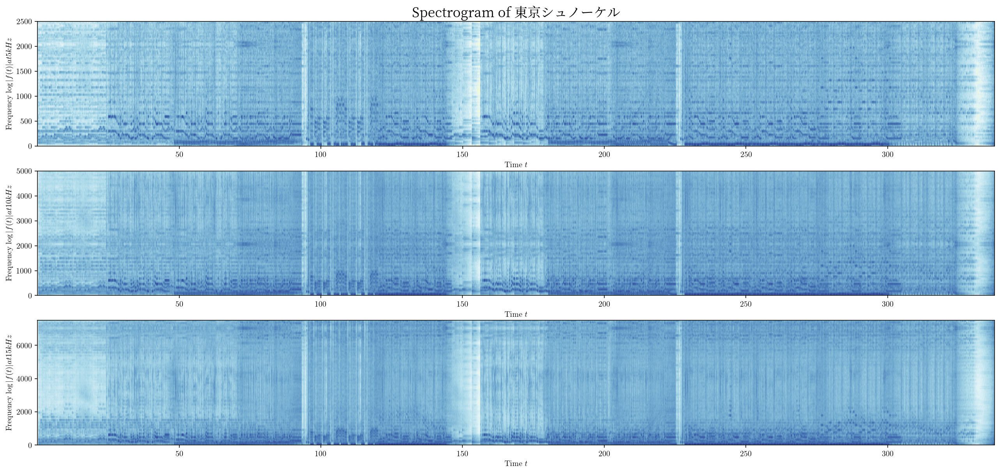

In [75]:
# STFT of the downsampled arrays
plt.figure(figsize=(22,10))
plt.subplot(311)
plt.specgram(source_arr_downsampled_5000, Fs=5000, cmap='RdYlBu')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $\log |f(t)| at 5 kHz$')
plt.title("Spectrogram of " + audio_meta["name"], usetex=False, fontproperties='Noto Serif SC', fontsize=17)
plt.subplot(312)
plt.specgram(source_arr_downsampled_10000, Fs=10000, cmap='RdYlBu')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $\log |f(t)| at 10 kHz$')
plt.subplot(313)
plt.specgram(source_arr_downsampled_15000, Fs=15000, cmap='RdYlBu')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $\log |f(t)| at 15 kHz$')
plt.savefig("./results/downsampled-spectrum.png")

We observe that the spectrum has differed largely from the original one. This can be expected because downsampling will cut the high frequencies of the audio.

# Task 3: Upsampling

In this section we will upsample the arrays so *recover* the audio to $44100 \text{ Hz}$.

5kHz upsampling complete, output length = 14896385
10kHz upsampling complete, output length = 14896387
15kHz upsampling complete, output length = 14896388


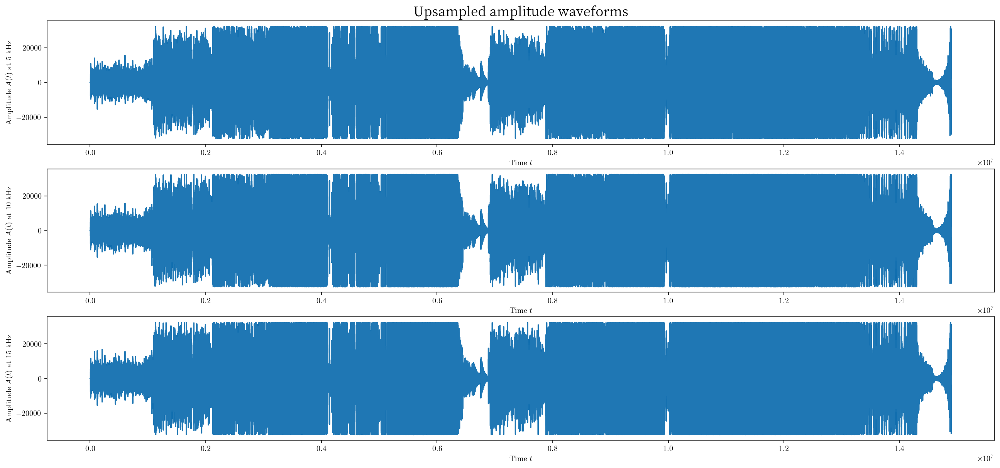

In [76]:
def upsample(arr, sample_rate, target_sample_rate, interpolation=None, dtype=None):
    """
    Upsample an array by a given factor (target sample rate).

    Parameters:
        arr: Downsampling target array
        sample_rate: Original sample rate of the array
        target_sample_rate: Target sample rate
        interpolation: Interpolation method, default is None, can be 'linear' or 'nearest'

    Returns:
        Upsampled array
    """
    upsampled_array = []
    sample_factor = sample_rate / target_sample_rate
    def sample_float_index(arr, index):
        if interpolation is None:
            return arr[int(index)]
        elif interpolation == "nearest":
            return arr[round(index)]
        elif interpolation == "linear":
            if abs(index - round(index)) < 1e-4:
                return arr[round(index)]
            else:
                return arr[int(index)] * (index - int(index)) + arr[int(index) + 1] * (int(index) + 1 - index)
    # Sample factor may not be an integer
    i = 0
    while round(i * sample_factor) + 1 < len(arr):
        upsampled_array.append(sample_float_index(arr, i * sample_factor))
        i += 1
    if dtype is not None:
        return np.array(upsampled_array, dtype=dtype)
    else:
        return upsampled_array

# Upsample the downsampled arrays
source_arr_upsampled_5000 = upsample(source_arr_downsampled_5000, 5000, 44100)
print("5kHz upsampling complete, output length =", len(source_arr_upsampled_5000))
source_arr_upsampled_10000 = upsample(source_arr_downsampled_10000, 10000, 44100)
print("10kHz upsampling complete, output length =", len(source_arr_upsampled_10000))
source_arr_upsampled_15000 = upsample(source_arr_downsampled_15000, 15000, 44100)
print("15kHz upsampling complete, output length =", len(source_arr_upsampled_15000))

plt.figure(figsize=(22,10))
plt.subplot(311)
plt.plot(source_arr_upsampled_5000)
plt.xlabel(r'Time $t$')
plt.ylabel(f'Amplitude $A(t)$ at 5 kHz')
plt.title("Upsampled amplitude waveforms", usetex=False, fontproperties='Noto Serif SC', fontsize=17)
plt.subplot(312)
plt.plot(source_arr_upsampled_10000)
plt.xlabel(r'Time $t$')
plt.ylabel(f'Amplitude $A(t)$ at 10 kHz')
plt.subplot(313)
plt.plot(source_arr_upsampled_15000)
plt.xlabel(r'Time $t$')
plt.ylabel(f'Amplitude $A(t)$ at 15 kHz')
plt.savefig("./results/upsampled-waveforms.png")

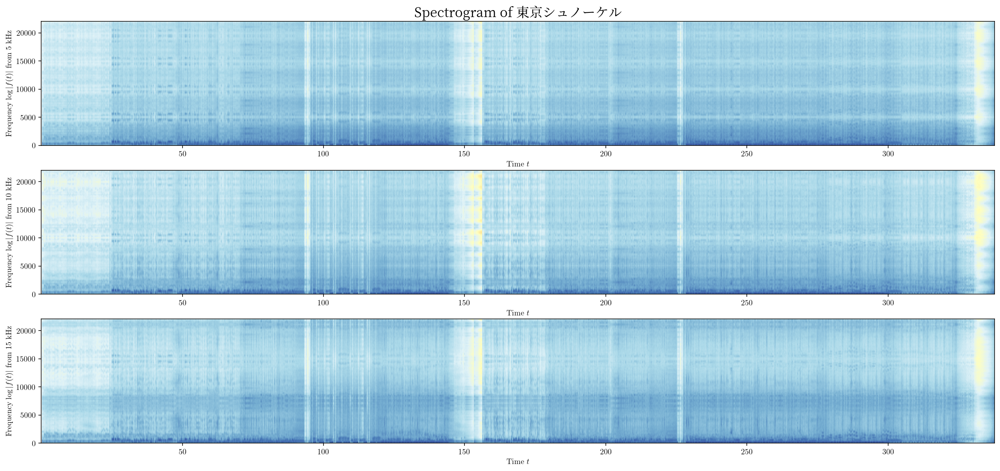

In [77]:
# STFT
plt.figure(figsize=(22,10))
plt.subplot(311)
plt.specgram(source_arr_upsampled_5000, Fs=44100, cmap='RdYlBu')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $\log |f(t)|$ from 5 kHz')
plt.title("Spectrogram of " + audio_meta["name"], usetex=False, fontproperties='Noto Serif SC', fontsize=17)
plt.subplot(312)
plt.specgram(source_arr_upsampled_10000, Fs=44100, cmap='RdYlBu')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $\log |f(t)|$ from 10 kHz')
plt.subplot(313)
plt.specgram(source_arr_upsampled_15000, Fs=44100, cmap='RdYlBu')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $\log |f(t)|$ from 15 kHz')
plt.savefig("./results/upsampled-spectrum.png")

In [78]:
# Generate the upsampled audio
array_to_wav(source_arr_upsampled_5000, 44100, "./audio/upsampled_5000.wav", stereo=True)
array_to_wav(source_arr_upsampled_10000, 44100, "./audio/upsampled_10000.wav", stereo=True)
array_to_wav(source_arr_upsampled_15000, 44100, "./audio/upsampled_15000.wav", stereo=True)

Writing to ./audio/upsampled_5000.wav with channels: 2
Writing to ./audio/upsampled_10000.wav with channels: 2
Writing to ./audio/upsampled_15000.wav with channels: 2


A quick listen to the output audio tells me that the upsampling is absolutely not perfect. This is deducible from the upsampling process itself, as information has been lost during the downsampling process.

We analyze the output spectrum and we can see that the output spectrum is not the same as the original one, as the high frequency part is lost completely.

# Task 4: Equalizer

In this part we will create an equalizer, but a static one.

> A **static equalizer** is a function that takes the original audio and exports a post-effected audio. A **dynamic equalizer** is a function that adds effect to the audio in real time as the audio is played.

To achieve this, we will need inversed STFT.

## STFT on the original audio

We've already parsed the original audio file and performed STFT. Recall those variables:

In [79]:
_, _, zxx = source_arr_f, source_arr_t, source_arr_zxx

We can see that `zxx` is a matrix that stores the strength of each frequency segment at each timestamp (based on `sample_rate`).

## Equalizer Implementation

A real-life equalizer is complicated. Its impulse response can be mainly characterized by a curve, which is a function of freqeuncy.

For each frequency segment, the equalizer *multiplies* onto the corresponding frequency segment. It can be modelled as another array $H$, where:

$$H[f] = r, r \in \mathbb{R}^+, f \in \mathtt{source\_arr\_f}$$

And, based on my personal experience in using equalizer when producing audio, I'll create a **vocal enhancer**.

In [80]:
class Equalizer():

    class EqualizerNode():
        def __init__(self, all_freq, node_freq, gain, range=0.1, nodetype="gain"):
            self.all_freq = all_freq
            self.freq = node_freq
            self.gain = gain
            self.range = range
            assert(nodetype in ["gain", "lowcut", "highcut"])
            self.type = nodetype
            self.hash = hash(np.random.random())
        def __repr__(self):
            if self.type == "gain":
                return f"<EqualizerNode.gain freq={self.freq}Hz, gain={self.gain}, range={self.range}>"
            elif self.type == "lowcut":
                return f"<EqualizerNode.lowcut freq={self.freq}Hz>"
            elif self.type == "highcut":
                return f"<EqualizerNode.highcut freq={self.freq}Hz>"
            else:
                return f"<EqualizerNode type=unknown>"
        def __str__(self):
            return self.__repr__()
        def __hash__(self):
            return self.hash
        def generate_array(self):
            effect = []
            if self.type == "gain":
                for i in range(len(self.all_freq)):
                    this_freq = self.all_freq[i]
                    if this_freq >= self.freq * (1 - self.range) and this_freq <= self.freq * (1 + self.range):
                        gain_strength = 1 - abs(self.freq - this_freq) / (self.range * self.freq)
                        gain_ratio = (np.sin(-np.pi * 0.5 + np.pi * gain_strength) + 1) * 0.5
                        effect.append(1 + self.gain * gain_ratio)
                    else:
                        effect.append(1)
            elif self.type == "lowcut":
                for i in range(len(self.all_freq)):
                    this_freq = self.all_freq[i]
                    if this_freq < self.freq:
                        effect.append(0)
                    else:
                        effect.append(1)
            elif self.type == "highcut":
                for i in range(len(self.all_freq)):
                    this_freq = self.all_freq[i]
                    if this_freq > self.freq:
                        effect.append(0)
                    else:
                        effect.append(1)
            else:
                raise ValueError("Unknown node type")
            return effect
    
    def __init__(self, freq, name):
        self.freq = freq
        self.name = name
        self.nodes = []

    def get_effect(self):
        effect = []
        for i in range(len(self.nodes)):
            effect.append(self.nodes[i].generate_array())
        # Sum all the effects
        effect = np.prod(effect, axis=0)
        return effect
    
    def get_nodes(self):
        return self.nodes

    def add_node(self, nodetype, freq, gain=None, range=0.1):
        if nodetype == "gain":
            self.nodes.append(Equalizer.EqualizerNode(self.freq, freq, gain, range, nodetype))
        elif nodetype == "lowcut":
            for node in self.nodes:
                if node.type == "lowcut":
                    raise ValueError("Lowcut node already exists")
            self.nodes.append(Equalizer.EqualizerNode(self.freq, freq, gain, range, nodetype))
        elif nodetype == "highcut":
            for node in self.nodes:
                if node.type == "highcut":
                    raise ValueError("Highcut node already exists")
            self.nodes.append(Equalizer.EqualizerNode(self.freq, freq, gain, range, nodetype))
        else:
            raise ValueError("Node type must be 'gain', 'lowcut', or 'highcut'")

    def get_gain(self, freq):
        effect = self.get_effect()
        # Find the closest frequency
        closest_freq = self.freq[np.argmin(np.abs(self.freq - freq))]
        # Find the index of the closest frequency
        closest_freq_index = closest_freq.index(freq)
        # Return the gain at that index
        return effect[closest_freq_index]
        
    def plot_show(self):
        effect = self.get_effect()
        plt.figure(figsize=(10,6))
        plt.plot(self.freq, effect)
        plt.xlabel(r'Frequency')
        plt.xlim(min(self.freq), max(self.freq))
        plt.ylabel(r'Gain')
        plt.title(f"{self.name} - Equalizer Effect")
        plt.show()
    
    def apply_effect(self, source_arr_f, source_arr_t, source_arr_zxx):
        effect = self.get_effect()
        # Apply the effect to the source array
        import copy
        zxx = copy.deepcopy(source_arr_zxx)
        for i in range(len(source_arr_t)):
            # print("Originally: ", zxx[:, i])
            zxx[:, i] = zxx[:, i] * effect
            # print("After: ", zxx[:, i])
        return source_arr_f, source_arr_t, zxx


## Testing: Low-pass (high-cut) filter

Length of source_arr_f: 129
Min frequency: 0.0
Max frequency: 22050.0


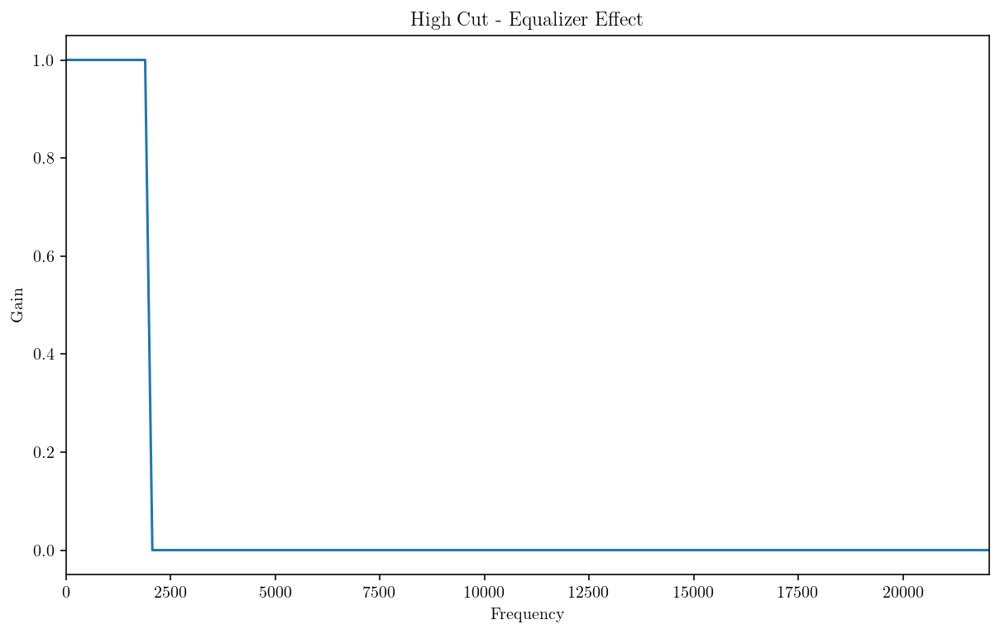

Writing to highcut_equalizer.wav with channels: 2


In [81]:
# Create a high-cut equalizer
print("Length of source_arr_f:", len(source_arr_f))
print("Min frequency:", min(source_arr_f))
print("Max frequency:", max(source_arr_f))
highcut_equalizer = Equalizer(source_arr_f, "High Cut")
highcut_equalizer.add_node("highcut", 2000)
# Plot the effect
highcut_equalizer.plot_show()
# Apply the effect to the source array
_, _, output_zxx = highcut_equalizer.apply_effect(source_arr_f, source_arr_t, source_arr_zxx)
# Write the output to a file after performing ISTFT
_, output_arr = signal.istft(output_zxx, fs=44100)
array_to_wav(output_arr, 44100, "./audio/highcut.wav", stereo=True)

The low-pass filter creates a good vintage effect.

## Testing: Vocal Enhancement

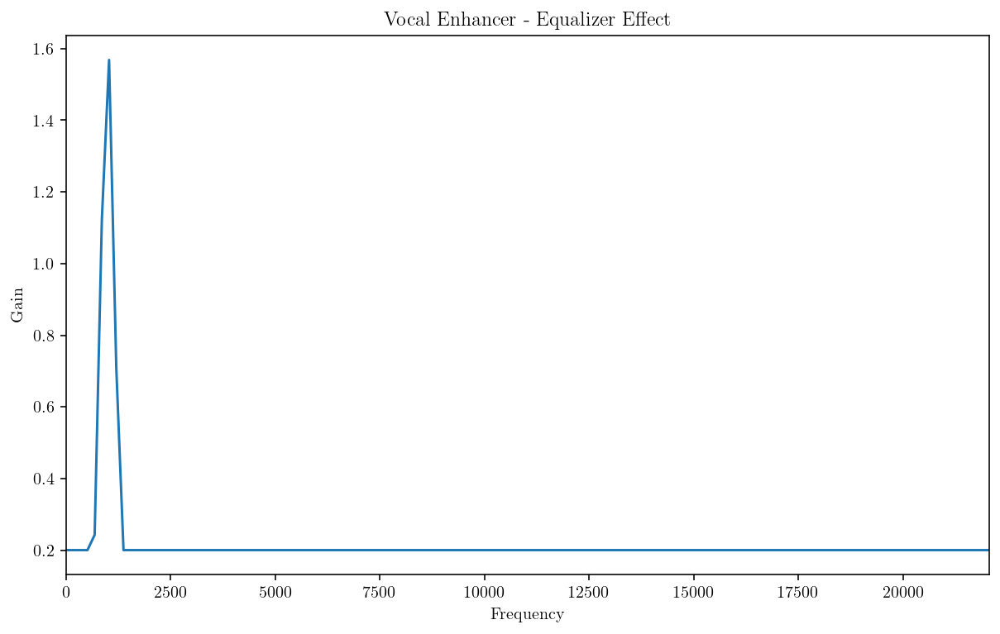

Writing to vocal_enhancer.wav with channels: 2


In [82]:
# Create a vocal enhancer
vocal_enhancer = Equalizer(source_arr_f, "Vocal Enhancer")
vocal_enhancer.add_node("gain", 10000, gain=-0.8, range=np.inf)
vocal_enhancer.add_node("gain", 1000, gain=7, range=0.35)
# Export
vocal_enhancer.plot_show()
_, _, output_zxx = vocal_enhancer.apply_effect(source_arr_f, source_arr_t, source_arr_zxx)
_, output_arr = signal.istft(output_zxx, fs=44100)
array_to_wav(output_arr, 44100, "vocal_enhancer.wav", stereo=True)

The exported version of the song has a much stronger vocal presence.

## Spectrum comparison

Here we compare the generated audio file with the original one. We generate the spectrum for both, and see the difference.

C:\Users\da-kun\AppData\Local\Temp\ipykernel_17168\2286287075.py:5: RuntimeWarning: divide by zero encountered in log
  plt.pcolormesh(source_arr_t, source_arr_f, np.log(np.abs(source_arr_zxx)), cmap='RdYlBu')
C:\Users\da-kun\AppData\Local\Temp\ipykernel_17168\2286287075.py:13: RuntimeWarning: divide by zero encountered in log
  plt.pcolormesh(source_arr_t, source_arr_f, np.log(np.abs(output_zxx)), cmap='RdYlBu')


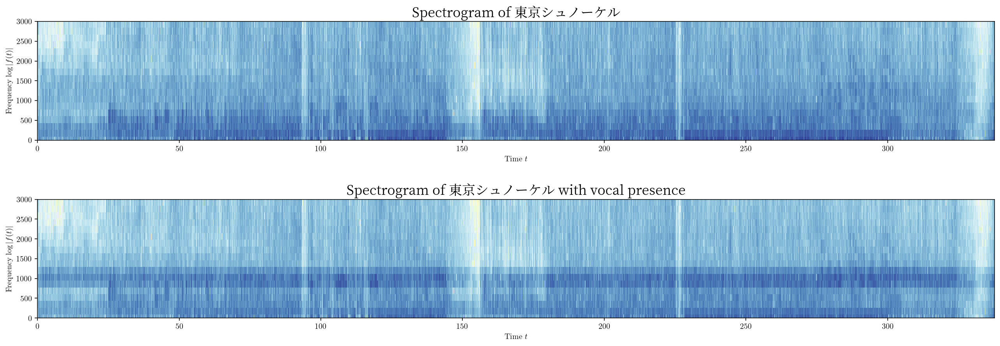

In [89]:
# Frequency spectrum
plt.figure(figsize=(22,7))
plt.subplot(2,1,1)
plt.title("Spectrogram of " + audio_meta["name"], usetex=False, fontproperties='Noto Serif SC', fontsize=17)
plt.pcolormesh(source_arr_t, source_arr_f, np.log(np.abs(source_arr_zxx)), cmap='RdYlBu')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $\log |f(t)|$')
plt.ylim(0, 3000)
# Levae space between subplots
plt.subplots_adjust(hspace=0.5)
plt.subplot(2,1,2)
plt.title("Spectrogram of " + audio_meta["name"] + " with vocal presence", usetex=False, fontproperties='Noto Serif SC', fontsize=17)
plt.pcolormesh(source_arr_t, source_arr_f, np.log(np.abs(output_zxx)), cmap='RdYlBu')
plt.xlabel(r'Time $t$')
plt.ylabel(f'Frequency $\log |f(t)|$')
plt.ylim(0, 3000)
plt.show()

We can see a significant boost at around $f=1000 \text{ Hz}$, which is about the vocal frequency.

# Conclusion

That's all for this assignment. During the whole task, we've toured through STFT and how to use its features to generate stylish audio using equalizers. STFT is a powerful tool in audio processing, and is even more widely used for music production and real-time music performing.

The world of DSP is growing rapidly. There are many tools and algorithms to perform STFT, and we shall continue to explore them, and the usages of STFT.

# License

The above code are under MIT License.